In [0]:
!pip install scprep

     |████████████████████████████████| 102kB 3.2MB/s 


In [0]:
import numpy as np
%matplotlib inline
import matplotlib.pylab as plt
from matplotlib import colors, cm

In [0]:
from google.colab import files

In [0]:
uploaded = files.upload()

Saving PatientRoute.csv to PatientRoute.csv


In [0]:
import pandas as pd
import io
df = pd.read_csv('PatientRoute.csv')

In [0]:
df

,patient_id,global_num,date,province,city,latitude,longitude
0,1400000001,1,2020-01-19,Incheon,Jung-gu,37.460459,126.440680
1,1400000001,1,2020-01-20,Incheon,Seo-gu,37.478832,126.668558
2,1000000001,2,2020-01-22,Gyeonggi-do,Gimpo-si,37.562143,126.801884
3,1000000001,2,2020-01-23,Seoul,Jung-gu,37.567454,127.005627
4,2000000001,3,2020-01-20,Incheon,Jung-gu,37.460459,126.440680
...,...,...,...,...,...,...,...
170,1200000031,31,2020-02-09,Daegu,Nam-gu,35.839820,128.566600
171,1200000031,31,2020-02-15,Daegu,Dong-gu,35.882410,128.662100
172,1200000031,31,2020-02-16,Daegu,Nam-gu,35.839820,128.566600
173,1200000031,31,2020-02-17,Daegu,Suseong-gu,35.844730,128.612300


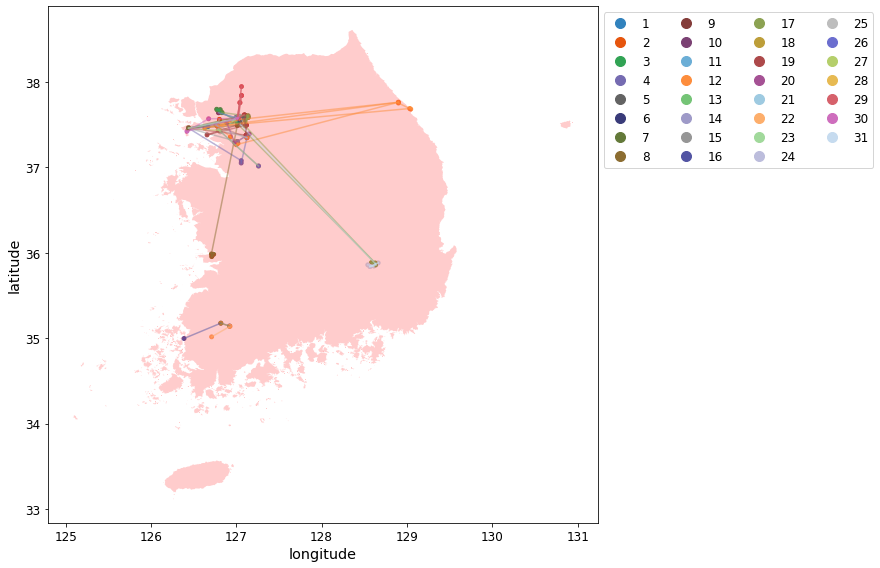

In [0]:
import scprep
colors = scprep.plot.colors.tab(len(np.unique(df['global_num']))).colors
cmap = {patient:colors[i] for i, patient in enumerate(np.unique(df['global_num']))}
ax = scprep.plot.scatter(x = df['longitude'], y=df['latitude'], c=df['global_num'], cmap=cmap,
                         legend_anchor=(1,1), figsize=(16,8), discrete=True)
map0.plot(ax=ax, color='red', alpha=0.2)
for patient in np.unique(df['global_num']):
  plot_df = df.loc[df['global_num']==patient].sort_values('date')
  for i in range(plot_df.shape[0]-1):
    ax.plot(plot_df.iloc[[i,i+1]]['longitude'], plot_df.iloc[[i,i+1]]['latitude'], color=cmap[patient], alpha=0.5)

## Contact graph

In [0]:
from scipy.spatial.distance import pdist, squareform
def dist(i, j):
  df_i = df.loc[df['global_num'] == i]
  df_j = df.loc[df['global_num'] == j]
  min_dist = np.float64('inf')
  for _, x in df_i.iterrows():
    for _, y in df_j.iterrows():
      d = np.sqrt(np.sum((x[['latitude', 'longitude']] - y[['latitude', 'longitude']])**2))
      if d < min_dist:
        min_dist = d
  return min_dist
pdist = np.array([[dist(i, j) for i in np.unique(df['global_num'])] for j in np.unique(df['global_num'])])

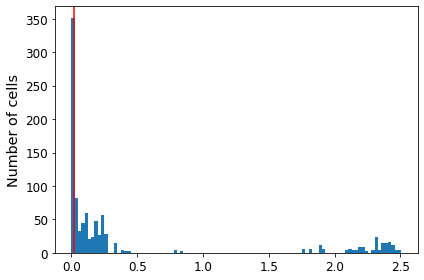

In [0]:
scprep.plot.histogram(pdist.flatten()[np.isfinite(pdist.flatten())], cutoff=0.02)

In [0]:
D = pdist
W = D < 0.02

In [0]:
!pip install pygsp

     |████████████████████████████████| 1.8MB 2.7MB/s 


In [0]:
import pygsp
G = pygsp.graphs.Graph(W, gtype='ROK Contact Map')
G.set_coordinates()

2020-03-25 15:46:41,784:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!


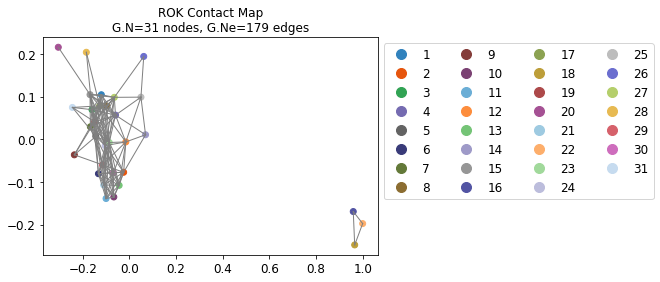

In [0]:
fig, ax = plt.subplots()
pygsp.plotting.plot_graph(G, show_edges=True, vertex_size=0.01, ax=ax)
scprep.plot.scatter2d(G.coords, c=np.unique(df['global_num']), legend_anchor=(1,1), ax=ax, discrete=True)

In [0]:
#let's say N of the G people were infected
#then go to the locations of these N people
#lets say each infected person i had contact with Ci people
#then each infected person increases the risk in their region by k*Ci
#so we can make a heatmap of the k*Ci! 

In [0]:
#ok let's try this. Let's say people 1, 6, 11, 16 and 21 are infected 
infected_num = [1, 6, 11, 16, 21]

In [0]:
mask =  np.tri(pdist.shape[0], k=-1)

In [0]:
sparse_pdist = np.ma.array(pdist, mask=mask)

In [0]:
contact_dist_max = 0.02
close_pairs = np.argwhere(sparse_pdist < contact_dist_max)

In [0]:
degrees_of_infection = np.zeros(len(pdist))

In [0]:
degrees_of_infection[infected_num] = 1

In [0]:
degrees_of_infection

array([0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [0]:
p_infect = .1
for pair in close_pairs:
  if pair[0] in infected_num:
    i = pair[1]
    degrees_of_infection[i] += p_infect

In [0]:
degrees_of_infection[degrees_of_infection > 1] = 1
degrees_of_infection

array([0. , 1. , 0. , 0. , 0. , 0.1, 1. , 0.1, 0.1, 0.1, 0.1, 1. , 0.2,
       0.2, 0.1, 0. , 1. , 0. , 0.2, 0. , 0.1, 1. , 0.4, 0.4, 0.1, 0. ,
       0.2, 0.1, 0.3, 0.2, 0.1])

In [0]:
for i in range(len(df)):
  person = df['global_num'][i]
  df['Probability_infected'][i] = degrees_of_infection[person - 1]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [0]:
df

,patient_id,global_num,date,province,city,latitude,longitude,Probability_infected
0,1400000001,1,2020-01-19,Incheon,Jung-gu,37.460459,126.440680,0.0
1,1400000001,1,2020-01-20,Incheon,Seo-gu,37.478832,126.668558,0.0
2,1000000001,2,2020-01-22,Gyeonggi-do,Gimpo-si,37.562143,126.801884,1.0
3,1000000001,2,2020-01-23,Seoul,Jung-gu,37.567454,127.005627,1.0
4,2000000001,3,2020-01-20,Incheon,Jung-gu,37.460459,126.440680,0.0
...,...,...,...,...,...,...,...,...
170,1200000031,31,2020-02-09,Daegu,Nam-gu,35.839820,128.566600,0.1
171,1200000031,31,2020-02-15,Daegu,Dong-gu,35.882410,128.662100,0.1
172,1200000031,31,2020-02-16,Daegu,Nam-gu,35.839820,128.566600,0.1
173,1200000031,31,2020-02-17,Daegu,Suseong-gu,35.844730,128.612300,0.1


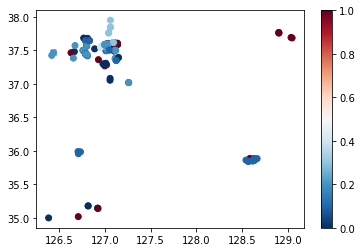

In [0]:
#now we use the location + infection probability to make a heatmap
plt.scatter(df['longitude'], df['latitude'], c=df['Probability_infected'], cmap=cm.RdBu_r)
plt.colorbar()
#right but I want to interpolate/smooth this a bit

In [0]:
# x = np.linspace(df['longitude'].min(), df['longitude'].max(), 30)
x = np.linspace(126, 129.2, 100)
y = np.linspace(34,38,100)
# y = np.linspace(df['latitude'].min(), df['latitude'].max(), 30)
X, Y = np.meshgrid(x, y)
heat = np.zeros_like(X)

for xi,yi, p in zip(df['longitude'], df['latitude'], df['Probability_infected']):
    xbin = np.argmin(abs(xi - x))
    ybin = np.argmin(abs(yi - y))
    heat[xbin-1, ybin-1] += p #the -1 is because of how bins work

In [0]:
# !pip install geopandas
import geopandas as gpd

In [0]:
files.upload()

Saving KOR_adm0.shp to KOR_adm0.shp
Saving KOR_adm0.shx to KOR_adm0.shx


{'KOR_adm0.shp': b'\x00\x00\'\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xfb\x0c\xe8\x03\x00\x00\x05\x00\x00\x00\x10\x00\x00@<E_@\x00\x00\x00\xc0X\x8e@@\x08\x00\x00\xe0\x17^`@\x1e\x00\x00\x00[NC@\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00(\xfa\xd6\x05\x00\x00\x00\x10\x00\x00@<E_@\x00\x00\x00\xc0X\x8e@@\x08\x00\x00\xe0\x17^`@\x1e\x00\x00\x00[NC@\x04\x06\x00\x00\xd7\x1d\x05\x00\x00\x00\x00\x00E\x00\x00\x00\xe3\x00\x00\x00\xfa\x00\x00\x005\x01\x00\x00X\x01\x00\x00\x7f\x01\x00\x00\xa1\x01\x00\x00\xea\x01\x00\x00\x03\x02\x00\x00\\\x02\x00\x00\xb7\x02\x00\x00\xce\x02\x00\x00\xdb\x02\x00\x00\xa7\x04\x00\x00\xea\x04\x00\x00\x03\x05\x00\x00C"\x00\x00X"\x00\x00w"\x00\x00\xac"\x00\x00\xd5"\x00\x00\xe8"\x00\x00\x05#\x00\x00v%\x00\x00\x85%\x00\x00\xa2%\x00\x00\xd3%\x00\x00\x0c&\x00\x00\xf5&\x00\x000\'\x00\x00;\'\x00\x00J\'\x00\x00_\'\x00\x00\xe8\'\x00\

In [0]:
map0 = gpd.read_file('KOR_adm0.shp')

(34.0, 38.0)

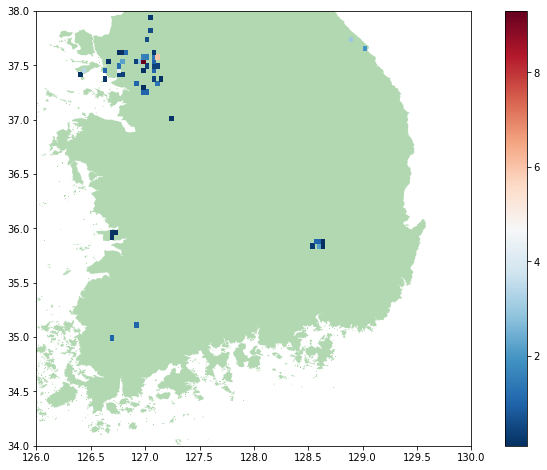

In [0]:
heat[heat < .1] = np.nan
fig, ax = plt.subplots(figsize=(12,8))
map0.plot(ax=ax, color='green', alpha=0.3)
a1 = ax.pcolormesh(X, Y, heat.T, cmap=cm.RdBu_r)
plt.colorbar(a1, ax=ax)
plt.xlim(126,130)
plt.ylim(34, 38)

In [0]:
#right, in principle we can fine grain this as much as we want.. but make sure you're not going finer than data sampling

In [0]:
#what if you have secondary contact
#at this point it's better to do a Hidden Markov Model; Scott's working on this